# AI_campus_ProstateSeg 
# Module 11: Image Segmentation Using U-Net Prototype
### PANDA: Prostate cANcer graDe Assessment (PANDA) Challenge

In this module, we will develop a basic U-Net model using convolutional layers in order to obtain segmentation results for the images. Unlike the previous module where we used a MLP softmax classifier to segment the images by predicting the distribution of classes for each pixel of the image, in this approach we will develop a U-Net model, which uses convolutional layers, in order to predict a segmentation mask. Unlike the MLP classifier, the images will be fed in a tile-wise manner in case of this model. These tiles will be non-overlapping in nature, and will be selected based on a certain signal to noise ratio (where signal is indicated by pixels that contain a value of more than 0, i.e. areas which contain tissue characterized by a category of disease progression). This type of a model is considerate of the spatial relationships and spatial distribution of the pixels in an image, effectively treating each pixel in context of its neighboring pixels, making it position sensitive. This contributes to the predictive process because images tend to exhibit a lot of spatial redundancy, where neighboring pixels tend to be related to each other. 

### 1. Import the necessary packages

In [248]:
import os
import tifffile
import numpy as np
import matplotlib.pyplot as plt
import panda_utils as putil
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.transforms as transforms
import cv2

from PIL import Image
from typing import List, Set, Union, Optional, Dict, Tuple
from torch.utils.data import Dataset, DataLoader
from dataclass import ToyPANDASDataset
from torchvision.transforms import functional as Fv
from scipy.stats import entropy
from normalizers import ChannelWiseMinMaxNormalizer
from sklearn.cluster import MeanShift
from sklearn.preprocessing import MinMaxScaler

### Reproducibility: fixed random seed

Run this cell once per session (before creating the model or `train_loader`) so training and shuffling are repeatable.

In [249]:
import random

SEED = 0


def set_seed(seed: int = SEED) -> None:
    """Fix seeds for Python, NumPy, and PyTorch (CPU/CUDA/MPS)."""
    random.seed(seed)
    np.random.seed(seed)
    os.environ["PYTHONHASHSEED"] = str(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)
    if getattr(torch.backends, "mps", None) and torch.backends.mps.is_available():
        torch.mps.manual_seed(seed)
    # Stricter CUDA determinism (no effect on MPS/CPU-only runs)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False


set_seed(SEED)
print(f"Random seed set to {SEED}")


Random seed set to 0


### 2. Define folder and subdirectory folder names for training and testing image-mask pairs

In [250]:
# Define root folder
ROOT_FOLDER = "sample_data"

# Define training data folders for images and masks
TRAIN_IMAGE_SUBFOLDER = "train_images"
TRAIN_MASK_SUBFOLDER = "train_label_masks"

# Define test data folders for images and masks
TEST_IMAGE_SUBFOLDER = "test_images"
TEST_MASK_SUBFOLDER = "test_label_masks"

# Define train image and mask directory paths
train_image_dir = os.path.join(ROOT_FOLDER, TRAIN_IMAGE_SUBFOLDER)
train_mask_dir = os.path.join(ROOT_FOLDER, TRAIN_MASK_SUBFOLDER)

# Define test image and mask directory paths
test_image_dir = os.path.join(ROOT_FOLDER, TEST_IMAGE_SUBFOLDER)
test_mask_dir = os.path.join(ROOT_FOLDER, TEST_MASK_SUBFOLDER)

### 3. Create list of image and mask files and print contents for both the training and test set data

In [251]:
train_image_files = list(filter(lambda file: file != '.DS_Store', sorted(os.listdir(train_image_dir))))
train_mask_files = list(filter(lambda file: file != '.DS_Store', sorted(os.listdir(train_mask_dir))))

test_image_files = list(filter(lambda file: file != '.DS_Store', sorted(os.listdir(test_image_dir))))
test_mask_files = list(filter(lambda file: file != '.DS_Store', sorted(os.listdir(test_mask_dir))))

Print list of training set image files

In [252]:
train_image_files

['0018ae58b01bdadc8e347995b69f99aa.tiff',
 '004dd32d9cd167d9cc31c13b704498af.tiff',
 '0068d4c7529e34fd4c9da863ce01a161.tiff',
 '006f6aa35a78965c92fffd1fbd53a058.tiff',
 '007433133235efc27a39f11df6940829.tiff',
 '0076bcb66e46fb485f5ba432b9a1fe8a.tiff',
 '008069b542b0439ed69b194674051964.tiff',
 '00928370e2dfeb8a507667ef1d4efcbb.tiff',
 '00951a7fad040bf7e90f32e81fc0746f.tiff',
 '00a26aaa82c959624d90dfb69fcf259c.tiff']

Print list of training set mask files. Each of these will have a "_mask.tiff" extension.

In [253]:
train_mask_files

['0018ae58b01bdadc8e347995b69f99aa_mask.tiff',
 '004dd32d9cd167d9cc31c13b704498af_mask.tiff',
 '0068d4c7529e34fd4c9da863ce01a161_mask.tiff',
 '006f6aa35a78965c92fffd1fbd53a058_mask.tiff',
 '007433133235efc27a39f11df6940829_mask.tiff',
 '0076bcb66e46fb485f5ba432b9a1fe8a_mask.tiff',
 '008069b542b0439ed69b194674051964_mask.tiff',
 '00928370e2dfeb8a507667ef1d4efcbb_mask.tiff',
 '00951a7fad040bf7e90f32e81fc0746f_mask.tiff',
 '00a26aaa82c959624d90dfb69fcf259c_mask.tiff']

Print list of test set image files

In [254]:
test_image_files

['00a7fb880dc12c5de82df39b30533da9.tiff',
 '00bbc1482301d16de3ff63238cfd0b34.tiff',
 '00c15b23b30a5ba061358d9641118904.tiff',
 '00c46b336b5b06423fcdec1b4d5bee06.tiff',
 '00c52cb4db1c7a5811a8f070a910c038.tiff']

Print list of test set mask files. Each of these will have a "_mask.tiff" extension.

In [255]:
test_mask_files

['00a7fb880dc12c5de82df39b30533da9_mask.tiff',
 '00bbc1482301d16de3ff63238cfd0b34_mask.tiff',
 '00c15b23b30a5ba061358d9641118904_mask.tiff',
 '00c46b336b5b06423fcdec1b4d5bee06_mask.tiff',
 '00c52cb4db1c7a5811a8f070a910c038_mask.tiff']

### 4. Run function from module 1 to verify pair match, such that each image is coupled with a mask file for both the training and test set data

Verify pair match for training image and mask files

In [256]:
putil.verify_pair_match(image_dir = train_image_dir,
                        mask_dir = train_mask_dir)

True

Verify pair match for testing image and mask files

In [257]:
putil.verify_pair_match(image_dir = test_image_dir,
                        mask_dir = test_mask_dir)

True

### 5. Run function from module 1 to verify dimensionality match between image and mask files

Verify dimensionality match for training set image and mask files

In [258]:
putil.verify_dim_match(image_dir = train_image_dir,
                       mask_dir = train_mask_dir,
                       root_folder = ROOT_FOLDER,
                       image_subfolder = TRAIN_IMAGE_SUBFOLDER,
                       mask_subfolder = TRAIN_MASK_SUBFOLDER)

True

Verify dimensionality match for testing set image and mask files

In [259]:
putil.verify_dim_match(image_dir = test_image_dir,
                       mask_dir = test_mask_dir,
                       root_folder = ROOT_FOLDER,
                       image_subfolder = TEST_IMAGE_SUBFOLDER,
                       mask_subfolder = TEST_MASK_SUBFOLDER)

True

### 6. Run function from module 1 to validate the mask directory for both the training set and test set image data

Validate the training set mask files

In [260]:
putil.validate_mask_dir(mask_dir = train_mask_dir,
                        root_folder = ROOT_FOLDER,
                        mask_subfolder = TRAIN_MASK_SUBFOLDER)

True

Validate the test set mask files

In [261]:
putil.validate_mask_dir(mask_dir = test_mask_dir,
                        root_folder = ROOT_FOLDER,
                        mask_subfolder = TEST_MASK_SUBFOLDER)

True

### 7. Load and print the dimensionalities of the images and masks from the training and testing sets

Print the dimensionalities of the image files in the training set

In [262]:
for image_file in train_image_files:
    img = tifffile.imread(os.path.join(ROOT_FOLDER, TRAIN_IMAGE_SUBFOLDER, image_file))
    print(img.shape)

(25344, 5888, 3)
(22528, 8192, 3)
(10496, 6912, 3)
(7680, 2048, 3)
(24320, 9472, 3)
(14848, 11776, 3)
(8704, 23808, 3)
(36352, 10752, 3)
(8192, 11520, 3)
(20736, 18688, 3)


Print the dimensionalities of the mask files in the training set

In [263]:
for image_file in train_mask_files:
    img = tifffile.imread(os.path.join(ROOT_FOLDER, TRAIN_MASK_SUBFOLDER, image_file))
    print(img.shape)

(25344, 5888, 3)
(22528, 8192, 3)
(10496, 6912, 3)
(7680, 2048, 3)
(24320, 9472, 3)
(14848, 11776, 3)
(8704, 23808, 3)
(36352, 10752, 3)
(8192, 11520, 3)
(20736, 18688, 3)


Print the dimensionalities of the image files in the testing set

In [264]:
for image_file in test_image_files:
    img = tifffile.imread(os.path.join(ROOT_FOLDER, TEST_IMAGE_SUBFOLDER, image_file))
    print(img.shape)

(4352, 32256, 3)
(26624, 5120, 3)
(36352, 8704, 3)
(31744, 4096, 3)
(23296, 9984, 3)


Print the dimensionalities of the mask files in the testing set

In [265]:
for image_file in test_mask_files:
    img = tifffile.imread(os.path.join(ROOT_FOLDER, TEST_MASK_SUBFOLDER, image_file))
    print(img.shape)

(4352, 32256, 3)
(26624, 5120, 3)
(36352, 8704, 3)
(31744, 4096, 3)
(23296, 9984, 3)


### 8. Re-write dataset class to load both images and masks in a tile by tile manner

The initial dataset class written in the fourth module did not return masks. Since we are setting up a pipeline for supervised machine learning, we will write another class that iterates over the images in a tile by tile manner and returns the tile alongside its corresponding mask

In [266]:
class ToyPANDASDataset(Dataset):
    
    def __init__(self,
                 image_dir: str,
                 mask_dir: str, 
                 root_dir: str,
                 mask_suffix: str = "_mask",
                 imfile_ext: str = ".tiff",
                 maskfile_ext: str = ".tiff",
                 tile_size: int = 224,
                 channel_idx: int = 0,
                 min_thresh: float = 0.5,
                 transform = None,
                 norm_func = None):
        
        """
        Dataset class for Toy PANDA dataset of 10 images and masks.
        
        Parameters
        -----------
        image_dir: str
            The directory containing the images. 
        
        mask_dir: str
            The directory containing the masks paired with each of the images. 
        
        root_dir: str
            The root directory containing both the image and mask folders.
        
        mask_suffix: str
            The suffix associated with mask files in the folder. In this case,
            it is "_mask." Each image is labeled alphanumerically, and its corresponding
            mask file has a "_mask" suffix following the alphanumeric name. 
        
        imfile_ext: str
            The extension or file type of the image file. In this case, it is ".tiff"
            
        maskfile_ext: str
            The extension or file type of the mask file. In this case, it is ".tiff"
        
        tile_size: int
            The size of the square tiles to extract from images in a non-overlapping way.
            Each tile extarcted from the image will contain (tile_size ** 2) number of pixels.
        
        channel_idx: int
            Since the masks in this PANDA dataset contain 3 channels. This constant indicates
            the location of the official, 2 by 2 mask in the 3 channel mask tensor. Default
            value is 0. 
        
        min_thresh: float
            This constant sets a criteria for tile qualification. A tile is only qualified to
            be positively filtered for the dataset if it containts signal (% of foreground of all pixels)
            that is more than or equal to min_thresh.
        
        transform: Optional[None, function]
            This object stores None or a function. If it is a function, this function is applied
            to the data before being returned by the get item dunder method. This transform could
            contain a normalization function or it could contain a series of augmentation steps
            applied before returning an image. 
        
        norm_func: Optional[None, function]
            Function to normalize a tile depending on certain pre-defined 
            min-max statistics (for min max normalization) or z-score normalization
            depending on pre-defined statistics for the mean and standard deviation. 
        
        """
        self.image_dir = image_dir
        self.mask_dir = mask_dir
        self.root_dir = root_dir
        self.mask_suffix = mask_suffix
        self.imfile_ext = imfile_ext
        self.maskfile_ext = maskfile_ext
        self.transform = transform
        self.norm_func = norm_func
        self.tile_size = tile_size
        self.full_mask_ext = self.mask_suffix + self.maskfile_ext
        self.channel_idx = channel_idx
        self.image_files = list(filter(lambda file: file != '.DS_Store', sorted(os.listdir(self.image_dir))))
        self.mask_files = list(filter(lambda file: file != '.DS_Store', sorted(os.listdir(self.mask_dir))))
        self.n_tiles_processed = 0
        self.n_qualifying_tiles = 0
        self.min_thresh = min_thresh
        self.imtile_coords = self.get_imtile_coords()
        self._preload_volumes()
        
    def _preload_volumes(self):
        """Load each whole-slide image and mask once (only ~10 files per split)."""
        self._image_cache = {}
        self._mask_cache = {}
        for imfile in self.image_files:
            self._image_cache[imfile] = tifffile.imread(
                os.path.join(self.image_dir, imfile)
            )
            regid = self.extract_raw_regid(imfile, self.imfile_ext)
            mask_file = regid + self.full_mask_ext
            mask = tifffile.imread(os.path.join(self.mask_dir, mask_file))
            self._mask_cache[imfile] = mask[:, :, self.channel_idx]
        print(f"Preloaded {len(self._image_cache)} image/mask pairs into memory.")
        
    def extract_raw_regid(self,
                          filename: str,
                          ext: str) -> str:
        """
        This function receives a filename which a specific
        extension like "_mask.tiff" or ".tiff", then it processes
        and returns the part of the filename up until but excluding
        the extension. 
        
        Parameters
        -----------
        filename: str
            The filename, with the name and extension as a suffix
        
        ext: str
            The extension
        
        Returns
        ----------
        The filename up until but excluding the extension
        
        """
        i = 1
        while filename[-i:] != ext:
            i += 1
        return filename[0:len(filename)-i]
    
    def tile_qualifier(self,
                       tile_mask: np.ndarray):
        """
        A tile qualifier function. This function
        receives a mask extracted from a tile. The mask
        can be binary or it could be multi-class,
        representing presence of multiple different classes
        indicated by integer values greater than or equal to 1. 
        The background (non-signal) region should be represented
        by 0. This function checks if the mask contains a minimum
        threshold of signal, as represented by the number of non-zero
        values as a percentage of the total number of pixels in the
        tile. 
        
        Parameters
        -----------
        tile_mask: np.ndarray
            A tile (square or rectangular) as a numpy array,
            containing integer values greater than or equal to 0.
        
        Returns
        ---------
        bool
            Whether the tile qualifies or not.
            Whether its signal ratio meets the minimum
            threshold requirement for it to qualify
            to be included in the dataset. 
            
        """
        
        signal_ratio = (tile_mask > 0).sum()/tile_mask.size
        
        return signal_ratio >= self.min_thresh
    
    def extract_nonoverlapping_tile_coords(self,
                                           mask: np.ndarray):
        
        """
        This function extracts nonoverlapping tile coordinates
        from a mask according to the tile_size. It collects
        the coordinates of the top left corner of each tile and 
        then returns it. 
        
        Paramters
        ---------
        mask: np.ndarray
            A mask of arbitrary shape. Containing 3 or more
            channels, but only the 0th channel is used as the
            official, signal indicating channel for extracting 
            tile coordinates.
        
        Returns
        --------
        List[Tuple[int, int]]
            A list of coordinates stored in tuples of size 2.
            These are coordinates of tiles that qualify according
            to the tile qualifier function. 
        """
        
        mask = mask[:,:,self.channel_idx]
        assert len(mask.shape) == 2
        R, C = mask.shape
        tile_coords = []
        for i in range(0, R, self.tile_size):
            for j in range(0, C, self.tile_size):
                try:
                    tile = mask[i : i + self.tile_size, j : j + self.tile_size]
                    self.n_tiles_processed += 1
                    if tile.shape == (self.tile_size, self.tile_size) and self.tile_qualifier(tile):
                        tile_coords.append((i, j))
                        self.n_qualifying_tiles += 1
                except IndexError:
                    print(f"Skipping tile at position ({i}, {j}) because it is out of bounds.")
                        
        return tile_coords
    
    def get_imtile_coords(self):
        
        """
        Function to process the images and return a list of 
        3-sized tuples that contain the name of the image file
        along with coordinates of qualifying tiles in them.
        The image file names can be repeated in tuples, but not
        the coordinate of the tiles.
        
        Parameters
        -----------
        None, all objects used are instantiated in the constructor.
        
        Returns
        -----------
        List[Tuple[str, in, int]]
            A list of tuples. The first value in the tuple is
            the name of the image file. The second and third
            values in the tuples are coordinates of one of the
            qualifying tiles in the image.
            
        """
        
        imtile_coords = []
        
        for imfile in self.image_files:
            regid = self.extract_raw_regid(imfile, self.imfile_ext)
            mask_file = regid + self.full_mask_ext
            mask = tifffile.imread(os.path.join(self.mask_dir, mask_file))
            tile_coords = self.extract_nonoverlapping_tile_coords(mask)
            imtile_coord = list(map(lambda tup : (imfile,) + tup, tile_coords))
            imtile_coords.extend(imtile_coord)
            
        self.tile_qualifying_ratio = self.n_qualifying_tiles / self.n_tiles_processed
        print(f"Total number of tiles processed: {self.n_tiles_processed}")
        print(f"Tile qualifying ratio: {round(self.tile_qualifying_ratio,2)}")
        print(f"Average number of tiles processed per image or mask: {self.n_tiles_processed/len(self.image_files)}")
        print(f"Average number of tiles qualifying per image or mask: {self.n_qualifying_tiles/len(self.image_files)}")
        
        imfiles = set([t[0] for t in imtile_coords])
        assert imfiles == set(self.image_files)
        i_vals = sorted(list(set([t[1] for t in imtile_coords])))
        j_vals = sorted(list(set([t[2] for t in imtile_coords])))
        
        for i in range(len(i_vals)-1):
            assert i_vals[i + 1] - i_vals[i] == self.tile_size
        
        for j in range(len(j_vals)-1):
            assert j_vals[j + 1] - j_vals[j] == self.tile_size
            
        return imtile_coords
        
    def __len__(self):
        
        """
        Dunder method to return the length of the
        dataset. The total length of the dataset 
        is the total number of tiles over all 
        of the images. Some images may provide more
        tiles to the dataset depending on their signal
        content, while other images may provide less
        tiles if they are weak in signal.
        """
        
        return len(self.imtile_coords)
    
    def __getitem__(self, idx):
        
        """
        Function for getting a tile from the dataset.
        Given an index, it finds a tuple in the imtile_coords
        and unpacks it to retrieve the image file and the coordinates
        of one of the qualifying tiles in the image. 
        """
        
        image_file, tile_i, tile_j = self.imtile_coords[idx]
        image = self._image_cache[image_file]
        tile = image[tile_i: tile_i + self.tile_size, tile_j: tile_j + self.tile_size, :]
        mask = self._mask_cache[image_file]
        tile_mask = mask[tile_i: tile_i + self.tile_size, tile_j: tile_j + self.tile_size]
        
        if self.transform:
            tile = self.transform(tile)
        
        if self.norm_func:
            tile = torch.tensor(tile)
            tile = tile.unsqueeze(0).permute(0, 3, 1, 2)
            tile = self.norm_func(tile)
            tile = tile.squeeze(0).permute(1,2,0)
            
        return tile, tile_mask

In [267]:
min_vals = torch.tensor([0, 0, 0])
max_vals = torch.tensor([255, 255, 255])

normalizer = ChannelWiseMinMaxNormalizer(min_values = min_vals,
                                         max_values = max_vals)

We have the following directories available for training and testing image and mask files:

- train_image_dir
- train_mask_dir

- test_image_dir
- test_mask_dir

### 9. Instantiate a DataLoader and start an iterator over the batch. While instantiating the DataLoader, pass the normalizer's transform function into the Dataset class

In [268]:
train_dataset = ToyPANDASDataset(image_dir = train_image_dir,
                                 mask_dir = train_mask_dir,
                                 root_dir = ROOT_FOLDER,
                                 norm_func = normalizer.transform,
                                 min_thresh = 0.5)

print("\n")

test_dataset = ToyPANDASDataset(image_dir = test_image_dir,
                                mask_dir = test_mask_dir,
                                root_dir = ROOT_FOLDER,
                                norm_func = normalizer.transform,
                                min_thresh = 0.5)

test_dataset_raw = ToyPANDASDataset(image_dir = test_image_dir,
                                    mask_dir = test_mask_dir,
                                    root_dir = ROOT_FOLDER,
                                    min_thresh = 0.5)

Total number of tiles processed: 38593
Tile qualifying ratio: 0.15
Average number of tiles processed per image or mask: 3859.3
Average number of tiles qualifying per image or mask: 596.6
Preloaded 10 image/mask pairs into memory.


Total number of tiles processed: 19352
Tile qualifying ratio: 0.23
Average number of tiles processed per image or mask: 3870.4
Average number of tiles qualifying per image or mask: 873.8
Preloaded 5 image/mask pairs into memory.
Total number of tiles processed: 19352
Tile qualifying ratio: 0.23
Average number of tiles processed per image or mask: 3870.4
Average number of tiles qualifying per image or mask: 873.8
Preloaded 5 image/mask pairs into memory.


Print the lengths of the training and testing datasets. This will return the number of tile and mask pairs available in the dataset. 

In [269]:
print(f"Length of the training dataset: {len(train_dataset)}")

Length of the training dataset: 5966


In [270]:
print(f"Length of the testing dataset: {len(test_dataset)}")

Length of the testing dataset: 4369


In order to perform a sanity check and verify the functionalities of the dataset and data loader classes, we will start an iterator over the training and testing datasets using a data loader.

In [271]:
# Preloading slides in the dataset still makes loading fast without workers.
_num_workers = 0
_pin_memory = torch.cuda.is_available()
_loader_kwargs = dict(
    batch_size=24,
    num_workers=_num_workers,
    pin_memory=_pin_memory,
    persistent_workers=False,
)

train_generator = torch.Generator()
train_generator.manual_seed(SEED)

train_loader = DataLoader(train_dataset, shuffle=True, generator=train_generator, **_loader_kwargs)
test_loader = DataLoader(test_dataset, shuffle=False, **_loader_kwargs)
test_loader_raw = DataLoader(test_dataset_raw, shuffle=False, **_loader_kwargs)


Print the lengths of the train and test loaders, this will return the total number of batches present in the training and test loaders

In [272]:
print(f"Number of batches present in the train_loader: {len(train_loader)}")
print(f"Number of batches present in the test_loader: {len(test_loader)}")

Number of batches present in the train_loader: 249
Number of batches present in the test_loader: 183


Start an iterator over the training and testing loaders

In [273]:
train_iter = iter(train_loader)
test_iter = iter(test_loader)
test_iter_raw = iter(test_loader_raw)

Obtain a batch for the train loader

In [274]:
train_images, train_masks = next(train_iter)

Print the shape of the training images batch

In [275]:
train_images.shape

torch.Size([24, 224, 224, 3])

Print the shape of the training masks batch

In [276]:
train_masks.shape

torch.Size([24, 224, 224])

Plot the first tile from the training image batch

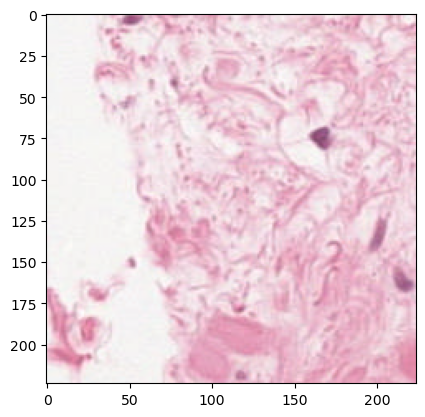

In [277]:
plt.imshow(train_images[0])

Enlist class presence in the first tile mask

In [278]:
putil.enlist_class_presence(train_masks[0])

array([1], dtype=uint8)

Summarize the distribution of classes in the first train mask

In [279]:
putil.summarize_class_distribution(train_masks[0].numpy())

{np.uint8(1): np.float64(1.0)}

Plot the last tile from the training image batch

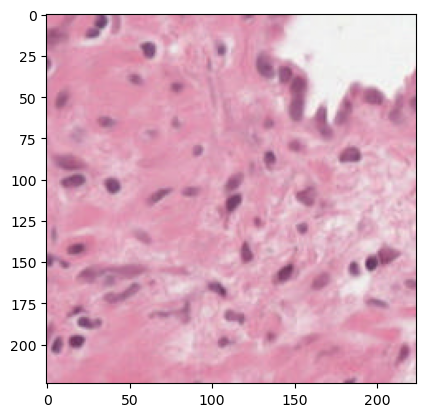

In [280]:
plt.imshow(train_images[-1])

Enlist class presence in the last tile mask

In [281]:
putil.enlist_class_presence(train_masks[-1])

array([1, 2], dtype=uint8)

Summarize the distribution of classes in the last train mask

In [282]:
putil.summarize_class_distribution(train_masks[-1].numpy())

{np.uint8(1): np.float64(0.95), np.uint8(2): np.float64(0.05)}

### Class distribution across all tiles in the train DataLoader

The cells above summarize class presence for a single batch or single tiles. The following cell aggregates pixel counts and tile counts over **every** tile yielded by `train_loader`.

Total qualifying train tiles: 5,966
Total mask pixels: 299,350,016

Global pixel distribution (% of all pixels across all train tiles):
  Class 0:   5.96%  (17,843,736 pixels)
  Class 1:  77.10%  (230,800,220 pixels)
  Class 2:   3.21%  (9,613,380 pixels)
  Class 3:   0.37%  (1,116,912 pixels)
  Class 4:   7.88%  (23,599,032 pixels)
  Class 5:   5.47%  (16,376,736 pixels)

Tiles containing each class (≥1 pixel of that class):
  Class 0: 1,779 / 5,966 tiles (29.8%)
  Class 1: 5,966 / 5,966 tiles (100.0%)
  Class 2: 1,450 / 5,966 tiles (24.3%)
  Class 3: 119 / 5,966 tiles (2.0%)
  Class 4: 1,491 / 5,966 tiles (25.0%)
  Class 5: 1,052 / 5,966 tiles (17.6%)


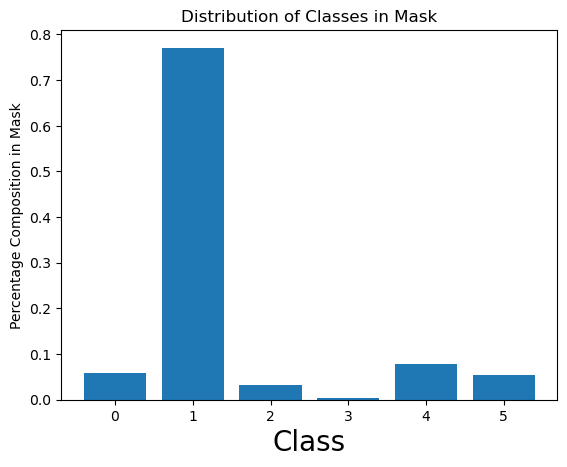

In [283]:
from collections import defaultdict

CLASS_IDS = list(range(6))  # background + 5 tissue classes
pixel_counts = defaultdict(int)
tiles_with_class = defaultdict(int)
n_tiles = 0

for _images, masks in train_loader:
    for tile_idx in range(masks.shape[0]):
        mask = masks[tile_idx].numpy()
        n_tiles += 1
        for class_id in np.unique(mask):
            tiles_with_class[int(class_id)] += 1
        for class_id in CLASS_IDS:
            pixel_counts[class_id] += int((mask == class_id).sum())

total_pixels = sum(pixel_counts.values())
print(f"Total qualifying train tiles: {n_tiles:,}")
print(f"Total mask pixels: {total_pixels:,}\n")

print("Global pixel distribution (% of all pixels across all train tiles):")
for class_id in CLASS_IDS:
    pct = 100.0 * pixel_counts[class_id] / total_pixels
    print(f"  Class {class_id}: {pct:6.2f}%  ({pixel_counts[class_id]:,} pixels)")

print("\nTiles containing each class (≥1 pixel of that class):")
for class_id in CLASS_IDS:
    n = tiles_with_class[class_id]
    print(f"  Class {class_id}: {n:,} / {n_tiles:,} tiles ({100.0 * n / n_tiles:.1f}%)")

global_dist = {c: round(pixel_counts[c] / total_pixels, 4) for c in CLASS_IDS}
putil.dict_to_histogram(global_dist, whole_classes=CLASS_IDS)


Obtain a batch for the test loader

In [284]:
test_images, test_masks = next(test_iter)

Print the shape of the test image batch

In [285]:
test_images.shape

torch.Size([24, 224, 224, 3])

Print the shape of the test mask batch

In [286]:
test_masks.shape

torch.Size([24, 224, 224])

Plot the first tile from the test image batch

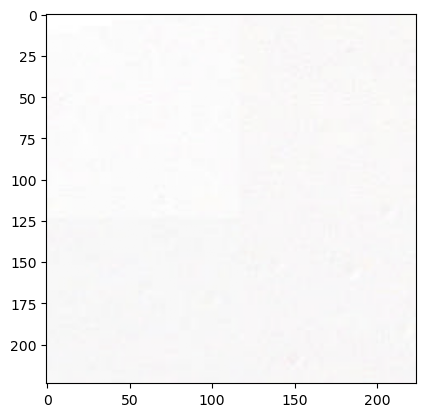

In [287]:
plt.imshow(test_images[0])

Enlist class presence in the first tile

In [288]:
putil.enlist_class_presence(test_masks[0])

array([0, 1], dtype=uint8)

Summarize distribution of classes in the first tile

In [289]:
putil.summarize_class_distribution(test_masks[0].numpy())

{np.uint8(0): np.float64(0.29), np.uint8(1): np.float64(0.71)}

In [290]:
test_images_raw, test_masks_raw = next(test_iter_raw)

Write basic U-Net model for semantic segmentation. The model will take as input the number of input channels (default = 3) and it will also take as input the number of classes, which is 6. The model will translate a tensor of shape [B, 3, H, W] to a tensor of shape [B, 6, H, W]. This will output a probability distribution over the six possible classes for each pixel in the image. 

In [291]:
class UNet(nn.Module):
    def __init__(self, in_channels=3, num_classes=6):
        super(UNet, self).__init__()

        def conv_block(in_ch, out_ch):
            return nn.Sequential(
                nn.Conv2d(in_ch, out_ch, kernel_size=3, padding=1),
                nn.BatchNorm2d(out_ch),
                nn.ReLU(inplace=True),
                nn.Conv2d(out_ch, out_ch, kernel_size=3, padding=1),
                nn.BatchNorm2d(out_ch),
                nn.ReLU(inplace=True)
            )

        def up_block(in_ch, out_ch):
            return nn.Sequential(
                nn.ConvTranspose2d(in_ch, out_ch, kernel_size=2, stride=2),
                nn.ReLU(inplace=True)
            )

        self.enc1 = conv_block(in_channels, 64)
        self.enc2 = conv_block(64, 128)
        self.enc3 = conv_block(128, 256)
        self.enc4 = conv_block(256, 512)

        self.pool = nn.MaxPool2d(2)

        self.bottleneck = conv_block(512, 1024)

        self.up4 = up_block(1024, 512)
        self.dec4 = conv_block(1024, 512)
        self.up3 = up_block(512, 256)
        self.dec3 = conv_block(512, 256)
        self.up2 = up_block(256, 128)
        self.dec2 = conv_block(256, 128)
        self.up1 = up_block(128, 64)
        self.dec1 = conv_block(128, 64)

        self.final = nn.Conv2d(64, num_classes, kernel_size=1)

    def forward(self, x):
        enc1 = self.enc1(x)
        enc2 = self.enc2(self.pool(enc1))
        enc3 = self.enc3(self.pool(enc2))
        enc4 = self.enc4(self.pool(enc3))

        bottleneck = self.bottleneck(self.pool(enc4))

        up4 = self.up4(bottleneck)
        dec4 = self.dec4(torch.cat([up4, enc4], dim=1))
        up3 = self.up3(dec4)
        dec3 = self.dec3(torch.cat([up3, enc3], dim=1))
        up2 = self.up2(dec3)
        dec2 = self.dec2(torch.cat([up2, enc2], dim=1))
        up1 = self.up1(dec2)
        dec1 = self.dec1(torch.cat([up1, enc1], dim=1))

        return self.final(dec1)

### Setup hyper-parameters for training of the model, including model instantiation, number of epochs, optimizer, and cross entropy loss function

### Weighted cross-entropy + weighted Dice loss

Class weights are computed from `pixel_counts` (run the train class-distribution cell first). The same inverse-frequency weights are used for **both** CE and Dice. Training minimizes `weighted_CE + dice_weight * weighted_Dice`.


In [292]:
class DiceLoss(nn.Module):
    """Multi-class Dice loss with optional per-class weights (1 - weighted mean Dice)."""
    def __init__(
        self,
        num_classes: int = 6,
        smooth: float = 1e-6,
        class_weights: Optional[torch.Tensor] = None,
    ):
        super().__init__()
        self.num_classes = num_classes
        self.smooth = smooth
        if class_weights is None:
            weights = torch.ones(num_classes, dtype=torch.float32)
        else:
            weights = class_weights.float().clone()
        # register_buffer so weights move with .to(device)
        self.register_buffer("class_weights", weights)

    def forward(self, logits: torch.Tensor, targets: torch.Tensor) -> torch.Tensor:
        # logits: [B, C, H, W], targets: [B, H, W]
        probs = F.softmax(logits, dim=1)
        targets = targets.long()
        targets_oh = F.one_hot(targets, self.num_classes).permute(0, 3, 1, 2).float()

        dice_per_class = []
        for c in range(self.num_classes):
            pred_c = probs[:, c]
            true_c = targets_oh[:, c]
            intersection = (pred_c * true_c).sum(dim=(1, 2))
            union = pred_c.sum(dim=(1, 2)) + true_c.sum(dim=(1, 2))
            dice_c = (2 * intersection + self.smooth) / (union + self.smooth)
            dice_per_class.append(dice_c)

        dice = torch.stack(dice_per_class, dim=1)  # [B, C]
        w = self.class_weights.view(1, -1)
        weighted_dice = (dice * w).sum(dim=1) / w.sum()
        return 1 - weighted_dice.mean()


def compute_class_weights(pixel_counts, num_classes: int = 6) -> torch.Tensor:
    """Inverse-frequency weights, normalized to mean 1."""
    total = sum(pixel_counts[c] for c in range(num_classes))
    weights = torch.tensor(
        [total / (num_classes * max(pixel_counts[c], 1)) for c in range(num_classes)],
        dtype=torch.float32,
    )
    return weights / weights.mean()


NUM_CLASSES = len(CLASS_IDS)
class_weights = compute_class_weights(pixel_counts, NUM_CLASSES)
print("Class weights (inverse frequency, mean=1) — used for CE and Dice:")
for c in CLASS_IDS:
    print(f"  Class {c}: {class_weights[c]:.4f}")

dice_loss_fn = DiceLoss(num_classes=NUM_CLASSES, class_weights=class_weights)
dice_loss_weight = 0.2  # tune: higher -> more emphasis on region overlap


Class weights (inverse frequency, mean=1) — used for CE and Dice:
  Class 0: 0.2891
  Class 1: 0.0223
  Class 2: 0.5366
  Class 3: 4.6184
  Class 4: 0.2186
  Class 5: 0.3150


In [369]:
# Pick best available accelerator (Apple Silicon -> MPS, NVIDIA -> CUDA)
if torch.cuda.is_available():
    device = torch.device("cuda")
elif getattr(torch.backends, "mps", None) and torch.backends.mps.is_available():
    device = torch.device("mps")
else:
    device = torch.device("cpu")
print(f"Training on: {device}")

# Reproducible weight initialization
set_seed(SEED)

# Instantiate the model and move to device
unet = UNet().to(device)
use_amp = device.type in ("cuda", "mps")

# Set number of epochs
num_epochs = 3

# Set up Adam optimizer
optimizer = torch.optim.Adam(unet.parameters(), lr=0.001)

# Weighted CE + weighted Dice (requires class_weights / dice_loss_fn from cell above)
ce_loss_fn = nn.CrossEntropyLoss(weight=class_weights.to(device))
dice_loss_fn = dice_loss_fn.to(device)

def segmentation_loss(logits, targets):
    ce = ce_loss_fn(logits, targets.long())
    dice = dice_loss_fn(logits, targets.long())
    total = ce + dice_loss_weight * dice
    return total, ce, dice

# List to store the loss at each step (epoch and batch)
epoch_losses = []
batch_losses = []

# In order to print batches at a certain interval, specify the batch print interval
batch_print_interval = 10

# Specify a boolean for printing the loss in batch intervals
print_batch_loss = True


Training on: mps


In [370]:
# Setup training loop for model on training dataset
for epoch in range(num_epochs):
    
    # Set epoch loss to zero
    epoch_loss = 0.0
    
    # Set unet model to training mode
    unet.train()
    
    # Loop over the batches of images and masks
    for batch_idx, (images, masks) in enumerate(train_loader):
        
        # [B, H, W, C] -> [B, C, H, W]; .contiguous() required for MPS backward (BatchNorm)
        images = images.permute(0, 3, 1, 2).contiguous().to(device, non_blocking=True)
        masks = masks.to(device, non_blocking=True)
        
        optimizer.zero_grad(set_to_none=True)
        
        # Mixed precision speeds up GPU/MPS matmuls with minimal accuracy impact
        with torch.autocast(device_type=device.type, enabled=use_amp):
            output = unet(images)
            loss, ce_loss, dice_loss = segmentation_loss(output, masks)
        
        loss.backward()
        optimizer.step()
        
        # Update the running total loss for the epoch
        epoch_loss += loss.item()
        
        # Append the loss to the list of batch losses
        batch_losses.append(loss.item())
        
        # Print batch loss
        if print_batch_loss and batch_idx % batch_print_interval == 0:
            print(f"Epoch [{epoch+1}/{num_epochs}], Batch [{batch_idx+1}/{len(train_loader)}], "
                  f"Loss: {loss.item():.4f} (CE: {ce_loss.item():.4f}, Dice: {dice_loss.item():.4f})")
    
    # Append the average loss for the epoch to the loss list
    avg_epoch_loss = epoch_loss / len(train_loader)
    epoch_losses.append(avg_epoch_loss)
    
    # Print the average loss at the end of the epoch
    print(f"Epoch [{epoch+1}/{num_epochs}] Average Loss: {avg_epoch_loss}")


Epoch [1/3], Batch [1/249], Loss: 2.1139 (CE: 1.9153, Dice: 0.9932)
Epoch [1/3], Batch [11/249], Loss: 1.8542 (CE: 1.6584, Dice: 0.9789)
Epoch [1/3], Batch [21/249], Loss: 1.7628 (CE: 1.5659, Dice: 0.9842)
Epoch [1/3], Batch [31/249], Loss: 1.3827 (CE: 1.1859, Dice: 0.9840)
Epoch [1/3], Batch [41/249], Loss: 1.8656 (CE: 1.6705, Dice: 0.9757)
Epoch [1/3], Batch [51/249], Loss: 1.5165 (CE: 1.3190, Dice: 0.9872)
Epoch [1/3], Batch [61/249], Loss: 1.5179 (CE: 1.3207, Dice: 0.9860)
Epoch [1/3], Batch [71/249], Loss: 1.4832 (CE: 1.2859, Dice: 0.9862)
Epoch [1/3], Batch [81/249], Loss: 1.5467 (CE: 1.3487, Dice: 0.9899)
Epoch [1/3], Batch [91/249], Loss: 1.8006 (CE: 1.6071, Dice: 0.9678)
Epoch [1/3], Batch [101/249], Loss: 1.7653 (CE: 1.5672, Dice: 0.9904)
Epoch [1/3], Batch [111/249], Loss: 1.6066 (CE: 1.4095, Dice: 0.9856)
Epoch [1/3], Batch [121/249], Loss: 1.5628 (CE: 1.3653, Dice: 0.9875)
Epoch [1/3], Batch [131/249], Loss: 1.6243 (CE: 1.4273, Dice: 0.9851)
Epoch [1/3], Batch [141/249], L

### Training loss curve (per batch)

Run after the training loop. `batch_losses` holds the total loss (weighted CE + Dice) for every batch, in order.

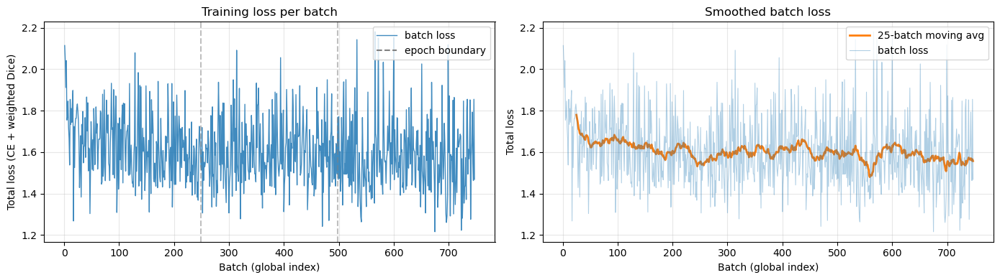

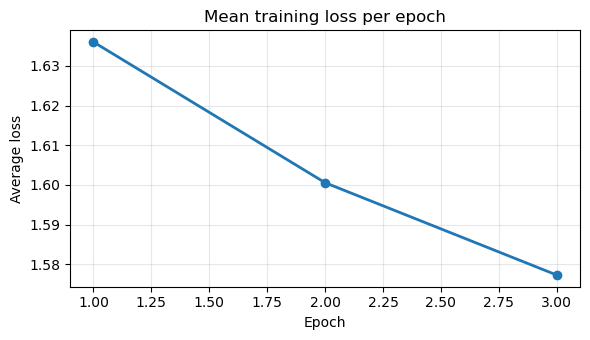

In [371]:
if len(batch_losses) == 0:
    print("No batch losses recorded. Run the training cell above first.")
else:
    batches_per_epoch = len(train_loader)
    x = np.arange(1, len(batch_losses) + 1)

    fig, axes = plt.subplots(1, 2, figsize=(14, 4))

    # --- Per-batch total loss ---
    ax = axes[0]
    ax.plot(x, batch_losses, color="C0", linewidth=1, alpha=0.85, label="batch loss")
    if num_epochs > 1:
        for ep in range(1, num_epochs):
            boundary = ep * batches_per_epoch + 0.5
            ax.axvline(boundary, color="gray", linestyle="--", alpha=0.5)
        ax.plot([], [], color="gray", linestyle="--", label="epoch boundary")
    ax.set_xlabel("Batch (global index)")
    ax.set_ylabel("Total loss (CE + weighted Dice)")
    ax.set_title("Training loss per batch")
    ax.legend(loc="upper right")
    ax.grid(True, alpha=0.3)

    # --- Smoothed curve (moving average) ---
    ax = axes[1]
    window = min(25, max(3, len(batch_losses) // 20))
    if len(batch_losses) >= window:
        kernel = np.ones(window) / window
        smoothed = np.convolve(batch_losses, kernel, mode="valid")
        x_smooth = np.arange(window, len(batch_losses) + 1)
        ax.plot(x_smooth, smoothed, color="C1", linewidth=2, label=f"{window}-batch moving avg")
    ax.plot(x, batch_losses, color="C0", linewidth=0.8, alpha=0.35, label="batch loss")
    ax.set_xlabel("Batch (global index)")
    ax.set_ylabel("Total loss")
    ax.set_title("Smoothed batch loss")
    ax.legend(loc="upper right")
    ax.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

    if len(epoch_losses) > 0:
        fig, ax = plt.subplots(figsize=(6, 3.5))
        ax.plot(range(1, len(epoch_losses) + 1), epoch_losses, marker="o", linewidth=2)
        ax.set_xlabel("Epoch")
        ax.set_ylabel("Average loss")
        ax.set_title("Mean training loss per epoch")
        ax.grid(True, alpha=0.3)
        plt.tight_layout()
        plt.show()


Write function to predict mask from batch of input images

In [372]:
def draw_mask(image: np.ndarray, 
              mask: np.ndarray,
              color_rgb_list: List[int] = [0, 255, 0]):
    
    """
    Function to draw mask on an image based on the
    mask given (mask). The mask will be translucent
    green given the default color in color_rgb_list = [0, 225, 0]
    
    Parameters
    -----------
    image: np.ndarray
        The image over which the mask is to be overlayed
    
    mask: np.ndarray
        The mask that is to be overlayed on the image. 
        This mask must be boolean (containing only True or False)
        
    color_rgb_list: List[int]
        The RGB pixel configuration of the color of the translucent
        mask to overlay on the image. 
        Default = [0, 255, 0] (green)
    
    Returns
    ---------
    np.ndarray
        The image with the colored mask overlaid along the 
        pixel locations which indicate True in the mask. 
    
    """
    
    image = np.asarray(image)
    if image.dtype != np.uint8:
        img = image.astype(np.float32)
        if img.max() <= 1.0:
            image = np.clip(img * 255, 0, 255).astype(np.uint8)
        else:
            image = np.clip(img, 0, 255).astype(np.uint8)
    
    masked_image = image.copy()
    masked_image = np.where(mask.astype(int),
                            np.array(color_rgb_list, dtype='uint8'),
                            masked_image)

    masked_image = masked_image.astype(np.uint8)

    return cv2.addWeighted(image, 0.3, masked_image, 0.7, 0)

In [373]:
def apply_segment_to_image_by_label(image,
                                    mask,
                                    label_id,
                                    color_lst):
    
    """
    Function to apply segmentation mask to image
    for a specific label_id
    
    Parameters
    -----------
    image: np.ndarray
        The image to which the segmentation mask is to
        be applied for that specific label_id
    
    mask: np.ndarray
        The mask which is to be applied to the image
        where the label_id is present
    
    label_id: int
        The label_id that is to be applied to the
        image from the segmentation mask
    
    color_lst: List[int]
        The color, expressed as list of RGB integer values,
        to be applied to the image where the label_id is
        present in the corresponding segmentation mask
    
    Returns
    --------
    np.ndarray
        The image with the segmentation mask applied
        at the pixel locations where label_id is present
        
    """
    
    avail_labels = list(putil.enlist_class_presence(mask))
    #assert label_id in avail_labels
    
    assert image.shape == mask.shape
    assert image.shape[-1] == 3 and mask.shape[-1] == 3
    
    assert np.sum(mask[:,:,1]) == 0 and np.sum(mask[:,:,2]) == 0
    
    if np.sum(mask[:,:,0]) == 0:
        print("The image is all background")
    
    reduced_mask = mask[:, :, 0]
    assert len(reduced_mask.shape) == 2
    
    assert set(list(np.unique(reduced_mask))) == set(avail_labels)
    
    boolean_label_mask = reduced_mask == label_id
    assert (reduced_mask == label_id).sum() == boolean_label_mask.sum()
    
    n_on_bits_for_label = (reduced_mask == label_id).sum()
    
    boolean_label_mask_3d = np.repeat(boolean_label_mask[:, :, np.newaxis], 3, axis=2)
    
    for i in range(3):
        assert np.sum(boolean_label_mask_3d[:, :, i]) == n_on_bits_for_label
        
    segmented_image = draw_mask(image, boolean_label_mask_3d, color_rgb_list = color_lst)
    
    return segmented_image

### Standard class color legend

Each class ID (0–5) uses the **same** overlay color for ground truth and predictions.

**Why is background (class 0) often missing in ground truth?** Training tiles use `min_thresh=0.5`, so only tiles with ≥50% tissue are kept. Most tiles are almost all classes 1–5, with few background pixels—class 0 may not appear in that tile's mask or printed list.


In [374]:
ID_TO_CLASS = {
    0: "background (non tissue) or unknown",
    1: "stroma (connective tissue, non-epithelium tissue)",
    2: "healthy (benign) epithelium",
    3: "cancerous epithelium (Gleason 3)",
    4: "cancerous epithelium (Gleason 4)",
    5: "cancerous epithelium (Gleason 5)",
}

# Same colors for GT and predicted masks
CLASS_ID_TO_RGB = {
    0: [0, 255, 0],      # green  - background
    1: [255, 0, 0],      # red    - stroma
    2: [0, 0, 255],      # blue   - healthy epithelium
    3: [255, 255, 0],    # yellow - Gleason 3
    4: [255, 0, 255],    # magenta - Gleason 4
    5: [0, 255, 255],    # cyan   - Gleason 5
}

CLASS_ID_TO_COLOR_NAME = {
    0: "green",
    1: "red",
    2: "blue",
    3: "yellow",
    4: "magenta",
    5: "cyan",
}

STANDARD_CLASS_IDS = list(ID_TO_CLASS.keys())


def print_class_color_legend(class_ids=None):
    """Print the fixed color legend for all or selected class IDs."""
    ids = STANDARD_CLASS_IDS if class_ids is None else sorted(class_ids)
    for class_id in ids:
        print(
            f"{CLASS_ID_TO_COLOR_NAME[class_id]:8s} : "
            f"{ID_TO_CLASS[class_id]} (class {class_id})"
        )


print("Standard overlay legend:")
print_class_color_legend()


def _image_to_uint8(image: np.ndarray) -> np.ndarray:
    """Ensure image is uint8 RGB for OpenCV blending."""
    image = np.asarray(image)
    if image.dtype != np.uint8:
        img = image.astype(np.float32)
        if img.max() <= 1.0:
            image = np.clip(img * 255, 0, 255).astype(np.uint8)
        else:
            image = np.clip(img, 0, 255).astype(np.uint8)
    return image


def overlay_segmentation_mask(
    image: np.ndarray,
    mask_2d: np.ndarray,
    print_color: bool = False,
    title: str = None,
) -> np.ndarray:
    """
    Colorize a 2D label mask with CLASS_ID_TO_RGB and blend onto image.
    Same mapping for ground truth and predictions.
    """
    image = _image_to_uint8(image)
    mask_2d = np.asarray(mask_2d)

    if mask_2d.ndim == 3:
        mask_2d = mask_2d[:, :, 0]

    h, w = mask_2d.shape
    colored_mask = np.zeros((h, w, 3), dtype=np.uint8)

    present_ids = [int(c) for c in np.unique(mask_2d)]
    if print_color:
        header = f"{title}:" if title else "Classes in mask:"
        print(header)

    for class_id in STANDARD_CLASS_IDS:
        if class_id not in present_ids:
            continue
        colored_mask[mask_2d == class_id] = CLASS_ID_TO_RGB[class_id]
        if print_color:
            print(
                f"  {CLASS_ID_TO_COLOR_NAME[class_id]:8s} : "
                f"{ID_TO_CLASS[class_id]} (class {class_id})"
            )

    return cv2.addWeighted(image, 0.3, colored_mask, 0.7, 0)



Standard overlay legend:
green    : background (non tissue) or unknown (class 0)
red      : stroma (connective tissue, non-epithelium tissue) (class 1)
blue     : healthy (benign) epithelium (class 2)
yellow   : cancerous epithelium (Gleason 3) (class 3)
magenta  : cancerous epithelium (Gleason 4) (class 4)
cyan     : cancerous epithelium (Gleason 5) (class 5)


In [375]:
def apply_segment_to_image_by_multiple_labels(image: np.ndarray,
                                              mask: np.ndarray,
                                              label_ids: Optional[List[int]] = None,
                                              print_color: bool = False) -> np.ndarray:
    """
    Overlay all labels in mask using the shared CLASS_ID_TO_RGB map.
    Delegates to overlay_segmentation_mask so GT and pred use identical colors.
    """
    if mask.ndim == 3:
        mask_2d = mask[:, :, 0]
    else:
        mask_2d = mask

    return overlay_segmentation_mask(
        image=image,
        mask_2d=mask_2d,
        print_color=print_color,
    )



In [376]:
def predict_mask(model, images, device=None):
    if device is None:
        device = next(model.parameters()).device
    model.eval()
    with torch.no_grad():
        images = images.permute(0, 3, 1, 2).contiguous().float().to(device)
        output = model(images)
        pred_mask = torch.argmax(output, dim=1)
    return pred_mask.cpu()

In [377]:
test_pred_mask = predict_mask(model = unet,
                              images = test_images)

In [378]:
test_images.shape

torch.Size([24, 224, 224, 3])

In [379]:
test_images_raw.shape

torch.Size([24, 224, 224, 3])

In [380]:
test_pred_mask.shape

torch.Size([24, 224, 224])

In [381]:
test_masks.shape

torch.Size([24, 224, 224])

In [382]:
def plot_gt_pred_image(image,
                       gt_mask,
                       pred_mask,
                       tile_size = 224):
    """
    Plot original, GT overlay, and prediction overlay using the same
    CLASS_ID_TO_RGB legend for both segmentation panels.
    """
    gt_segmented_image = overlay_segmentation_mask(
        image=image,
        mask_2d=gt_mask,
        print_color=True,
        title="Ground truth classes in tile",
    )
    print()

    pred_segmented_image = overlay_segmentation_mask(
        image=image,
        mask_2d=pred_mask,
        print_color=True,
        title="Predicted classes in tile",
    )

    fig, ax = plt.subplots(1, 3, figsize=(12, 6))

    ax[0].imshow(image)
    ax[0].set_title('Original Image')
    ax[0].axis('off')

    ax[1].imshow(gt_segmented_image)
    ax[1].set_title('Ground Truth Segmented Image')
    ax[1].axis('off')

    ax[2].imshow(pred_segmented_image)
    ax[2].set_title('U-Net Segmented Image')
    ax[2].axis('off')

    plt.tight_layout()
    plt.show()



Ground truth classes in tile:
  green    : background (non tissue) or unknown (class 0)
  red      : stroma (connective tissue, non-epithelium tissue) (class 1)

Predicted classes in tile:
  green    : background (non tissue) or unknown (class 0)
  red      : stroma (connective tissue, non-epithelium tissue) (class 1)


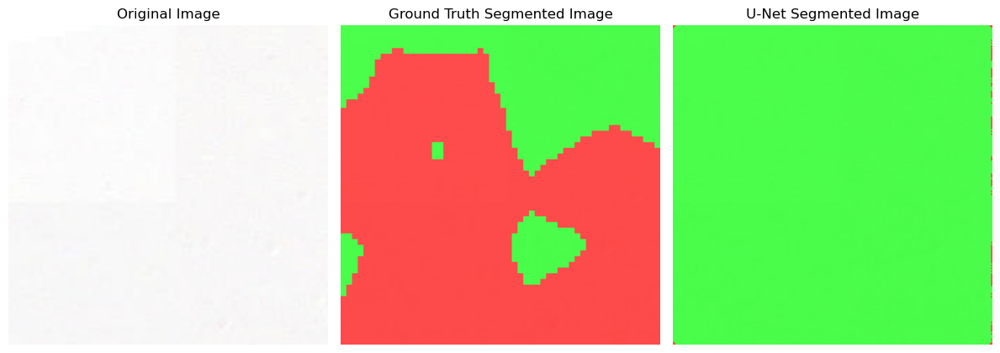

In [383]:
sample_id = 0

plot_gt_pred_image(image = test_images_raw[sample_id].numpy(),
                   gt_mask = test_masks[sample_id].numpy(),
                   pred_mask = test_pred_mask[sample_id].numpy())

Ground truth classes in tile:
  green    : background (non tissue) or unknown (class 0)
  red      : stroma (connective tissue, non-epithelium tissue) (class 1)
  magenta  : cancerous epithelium (Gleason 4) (class 4)

Predicted classes in tile:
  green    : background (non tissue) or unknown (class 0)
  red      : stroma (connective tissue, non-epithelium tissue) (class 1)
  blue     : healthy (benign) epithelium (class 2)
  yellow   : cancerous epithelium (Gleason 3) (class 3)
  magenta  : cancerous epithelium (Gleason 4) (class 4)
  cyan     : cancerous epithelium (Gleason 5) (class 5)


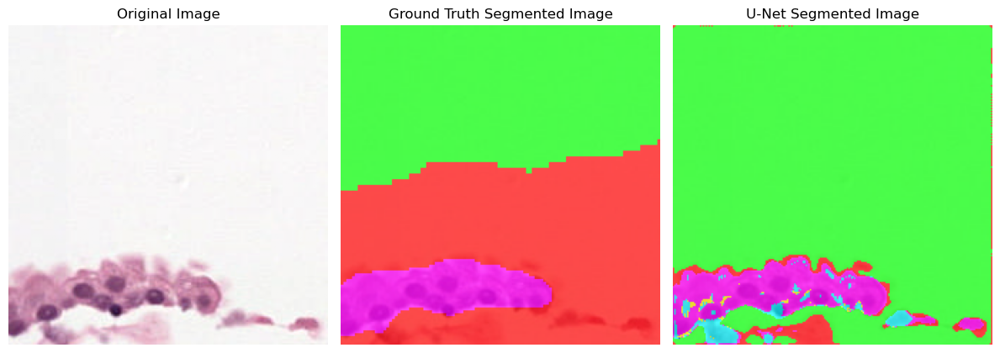

In [384]:
sample_id = 1

plot_gt_pred_image(image = test_images[sample_id].numpy(),
                   gt_mask = test_masks[sample_id].numpy(),
                   pred_mask = test_pred_mask[sample_id].numpy())

Ground truth classes in tile:
  green    : background (non tissue) or unknown (class 0)
  red      : stroma (connective tissue, non-epithelium tissue) (class 1)
  yellow   : cancerous epithelium (Gleason 3) (class 3)

Predicted classes in tile:
  green    : background (non tissue) or unknown (class 0)
  red      : stroma (connective tissue, non-epithelium tissue) (class 1)
  yellow   : cancerous epithelium (Gleason 3) (class 3)
  magenta  : cancerous epithelium (Gleason 4) (class 4)
  cyan     : cancerous epithelium (Gleason 5) (class 5)


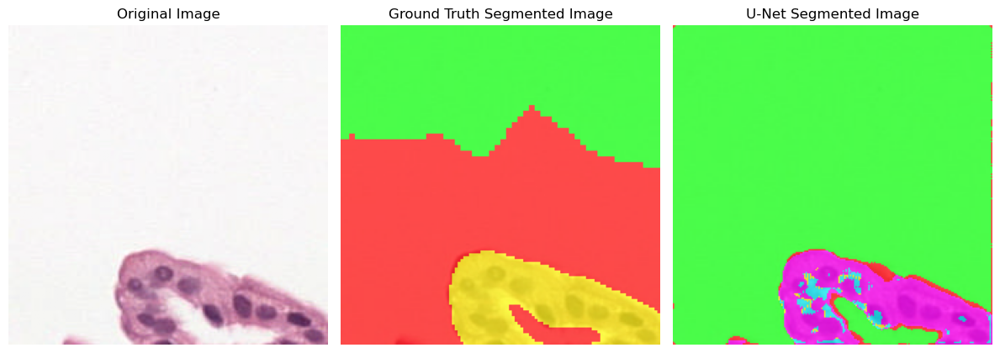

In [385]:
sample_id = 2

plot_gt_pred_image(image = test_images[sample_id].numpy(),
                   gt_mask = test_masks[sample_id].numpy(),
                   pred_mask = test_pred_mask[sample_id].numpy())

Ground truth classes in tile:
  green    : background (non tissue) or unknown (class 0)
  red      : stroma (connective tissue, non-epithelium tissue) (class 1)
  yellow   : cancerous epithelium (Gleason 3) (class 3)

Predicted classes in tile:
  green    : background (non tissue) or unknown (class 0)
  red      : stroma (connective tissue, non-epithelium tissue) (class 1)
  yellow   : cancerous epithelium (Gleason 3) (class 3)
  magenta  : cancerous epithelium (Gleason 4) (class 4)
  cyan     : cancerous epithelium (Gleason 5) (class 5)


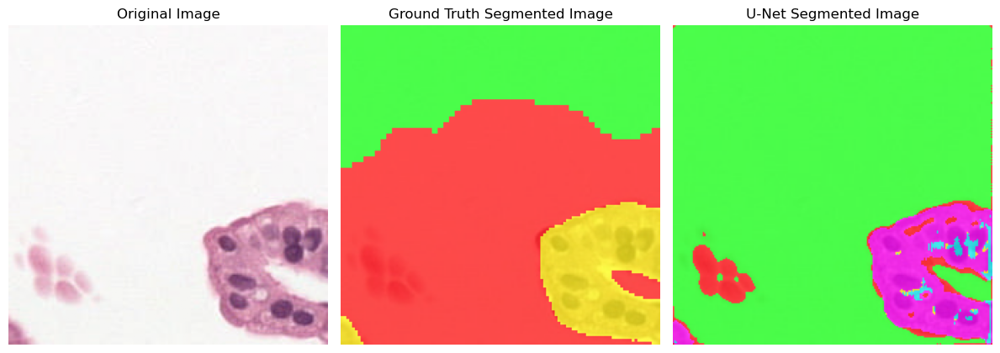

In [386]:
sample_id = 3

plot_gt_pred_image(image = test_images[sample_id].numpy(),
                   gt_mask = test_masks[sample_id].numpy(),
                   pred_mask = test_pred_mask[sample_id].numpy())

Ground truth classes in tile:
  green    : background (non tissue) or unknown (class 0)
  red      : stroma (connective tissue, non-epithelium tissue) (class 1)
  yellow   : cancerous epithelium (Gleason 3) (class 3)

Predicted classes in tile:
  green    : background (non tissue) or unknown (class 0)
  red      : stroma (connective tissue, non-epithelium tissue) (class 1)
  yellow   : cancerous epithelium (Gleason 3) (class 3)
  magenta  : cancerous epithelium (Gleason 4) (class 4)
  cyan     : cancerous epithelium (Gleason 5) (class 5)


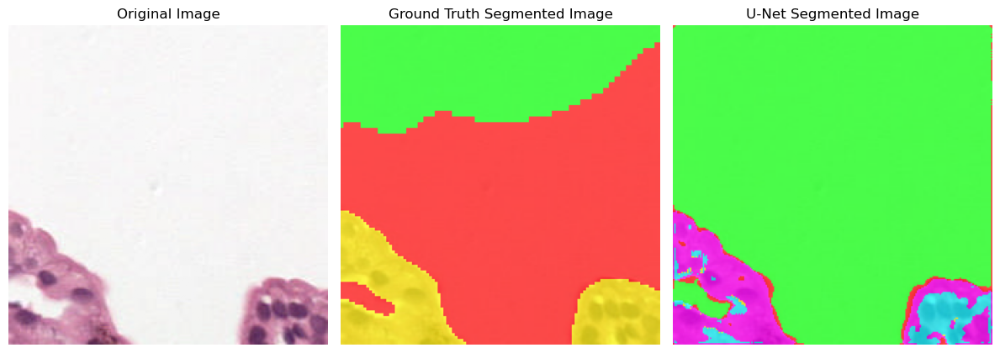

In [387]:
sample_id = 4

plot_gt_pred_image(image = test_images[sample_id].numpy(),
                   gt_mask = test_masks[sample_id].numpy(),
                   pred_mask = test_pred_mask[sample_id].numpy())

Ground truth classes in tile:
  green    : background (non tissue) or unknown (class 0)
  red      : stroma (connective tissue, non-epithelium tissue) (class 1)
  yellow   : cancerous epithelium (Gleason 3) (class 3)

Predicted classes in tile:
  green    : background (non tissue) or unknown (class 0)
  red      : stroma (connective tissue, non-epithelium tissue) (class 1)
  blue     : healthy (benign) epithelium (class 2)
  yellow   : cancerous epithelium (Gleason 3) (class 3)
  magenta  : cancerous epithelium (Gleason 4) (class 4)
  cyan     : cancerous epithelium (Gleason 5) (class 5)


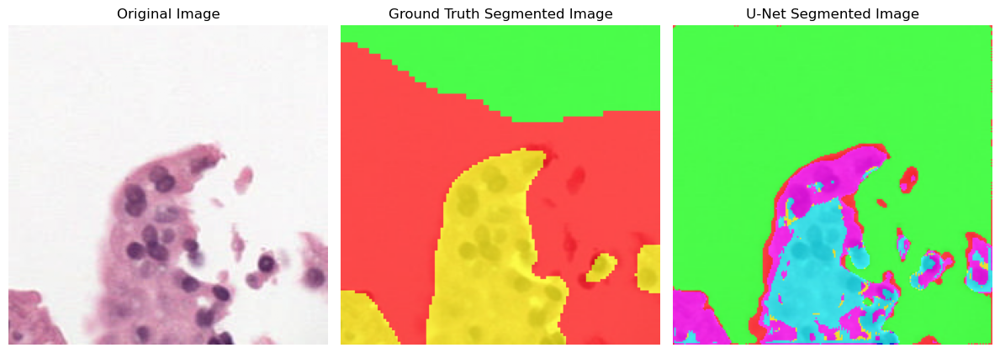

In [388]:
sample_id = 5

plot_gt_pred_image(image = test_images[sample_id].numpy(),
                   gt_mask = test_masks[sample_id].numpy(),
                   pred_mask = test_pred_mask[sample_id].numpy())

Ground truth classes in tile:
  green    : background (non tissue) or unknown (class 0)
  red      : stroma (connective tissue, non-epithelium tissue) (class 1)
  yellow   : cancerous epithelium (Gleason 3) (class 3)

Predicted classes in tile:
  green    : background (non tissue) or unknown (class 0)
  red      : stroma (connective tissue, non-epithelium tissue) (class 1)
  yellow   : cancerous epithelium (Gleason 3) (class 3)
  magenta  : cancerous epithelium (Gleason 4) (class 4)
  cyan     : cancerous epithelium (Gleason 5) (class 5)


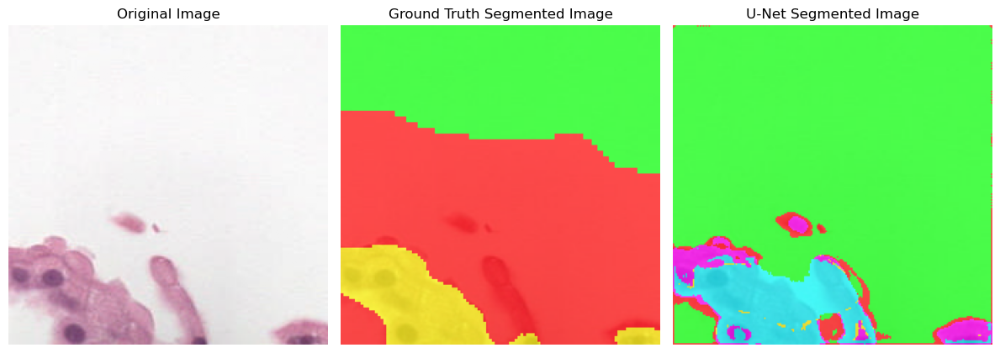

In [389]:
sample_id = 6

plot_gt_pred_image(image = test_images[sample_id].numpy(),
                   gt_mask = test_masks[sample_id].numpy(),
                   pred_mask = test_pred_mask[sample_id].numpy())

Ground truth classes in tile:
  green    : background (non tissue) or unknown (class 0)
  red      : stroma (connective tissue, non-epithelium tissue) (class 1)

Predicted classes in tile:
  green    : background (non tissue) or unknown (class 0)
  red      : stroma (connective tissue, non-epithelium tissue) (class 1)
  yellow   : cancerous epithelium (Gleason 3) (class 3)
  magenta  : cancerous epithelium (Gleason 4) (class 4)
  cyan     : cancerous epithelium (Gleason 5) (class 5)


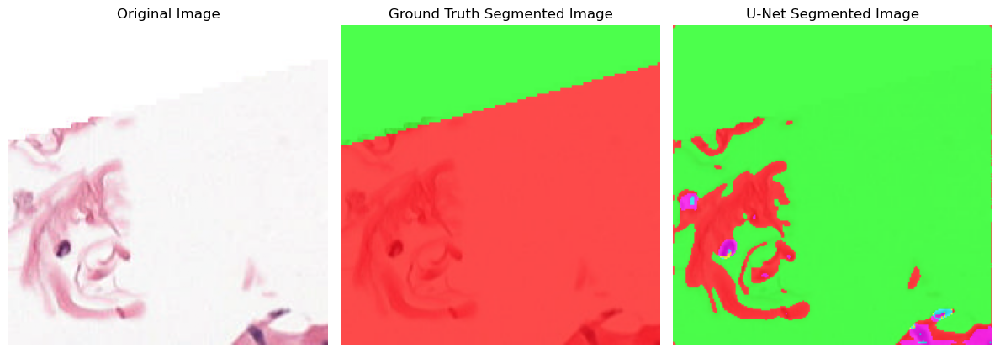

In [390]:
sample_id = 7

plot_gt_pred_image(image = test_images[sample_id].numpy(),
                   gt_mask = test_masks[sample_id].numpy(),
                   pred_mask = test_pred_mask[sample_id].numpy())

Ground truth classes in tile:
  green    : background (non tissue) or unknown (class 0)
  red      : stroma (connective tissue, non-epithelium tissue) (class 1)

Predicted classes in tile:
  green    : background (non tissue) or unknown (class 0)
  red      : stroma (connective tissue, non-epithelium tissue) (class 1)
  yellow   : cancerous epithelium (Gleason 3) (class 3)
  magenta  : cancerous epithelium (Gleason 4) (class 4)
  cyan     : cancerous epithelium (Gleason 5) (class 5)


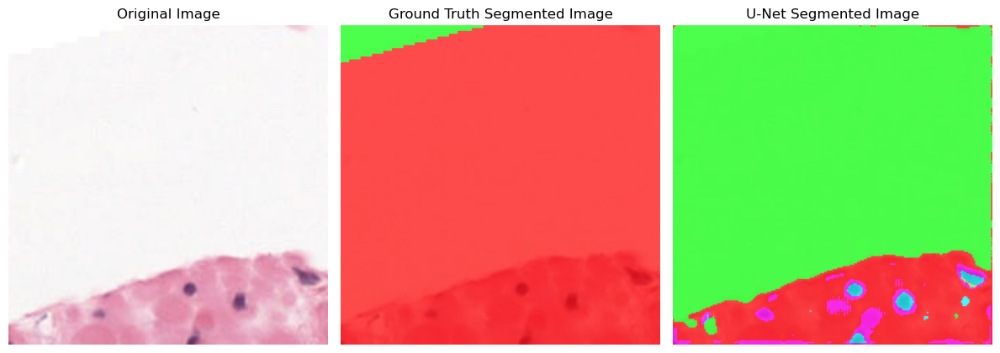

In [391]:
sample_id = 8

plot_gt_pred_image(image = test_images_raw[sample_id].numpy(),
                   gt_mask = test_masks[sample_id].numpy(),
                   pred_mask = test_pred_mask[sample_id].numpy())

Ground truth classes in tile:
  red      : stroma (connective tissue, non-epithelium tissue) (class 1)

Predicted classes in tile:
  green    : background (non tissue) or unknown (class 0)
  red      : stroma (connective tissue, non-epithelium tissue) (class 1)
  magenta  : cancerous epithelium (Gleason 4) (class 4)


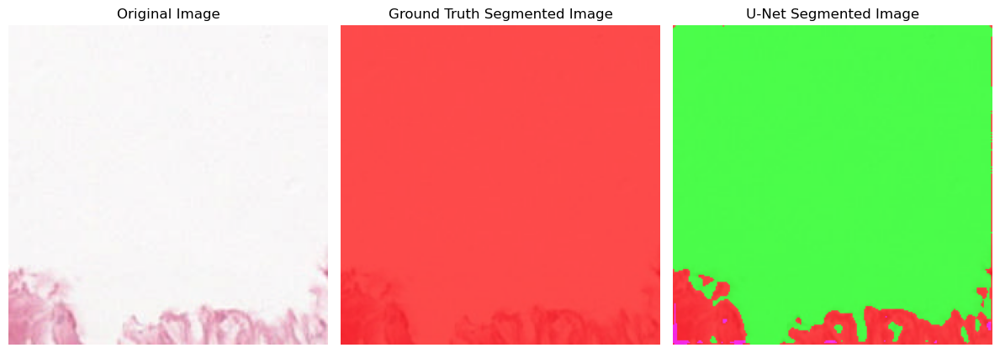

In [392]:
sample_id = 9

plot_gt_pred_image(image = test_images_raw[sample_id].numpy(),
                   gt_mask = test_masks[sample_id].numpy(),
                   pred_mask = test_pred_mask[sample_id].numpy())

Ground truth classes in tile:
  red      : stroma (connective tissue, non-epithelium tissue) (class 1)

Predicted classes in tile:
  green    : background (non tissue) or unknown (class 0)
  red      : stroma (connective tissue, non-epithelium tissue) (class 1)
  blue     : healthy (benign) epithelium (class 2)
  yellow   : cancerous epithelium (Gleason 3) (class 3)
  magenta  : cancerous epithelium (Gleason 4) (class 4)
  cyan     : cancerous epithelium (Gleason 5) (class 5)


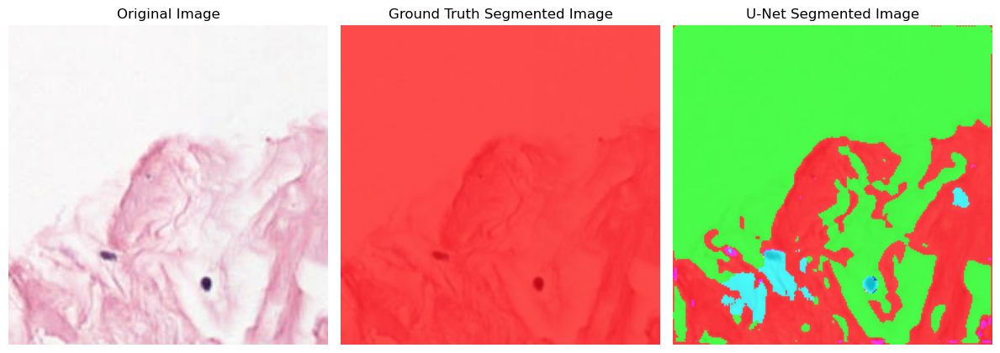

In [393]:
sample_id = 10

plot_gt_pred_image(image = test_images_raw[sample_id].numpy(),
                   gt_mask = test_masks[sample_id].numpy(),
                   pred_mask = test_pred_mask[sample_id].numpy())

Ground truth classes in tile:
  red      : stroma (connective tissue, non-epithelium tissue) (class 1)

Predicted classes in tile:
  green    : background (non tissue) or unknown (class 0)
  red      : stroma (connective tissue, non-epithelium tissue) (class 1)
  magenta  : cancerous epithelium (Gleason 4) (class 4)
  cyan     : cancerous epithelium (Gleason 5) (class 5)


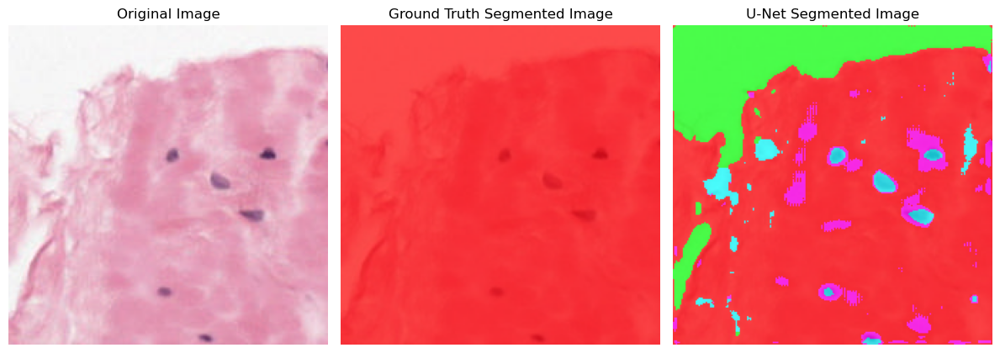

In [394]:
sample_id = 11

plot_gt_pred_image(image = test_images_raw[sample_id].numpy(),
                   gt_mask = test_masks[sample_id].numpy(),
                   pred_mask = test_pred_mask[sample_id].numpy())

Ground truth classes in tile:
  green    : background (non tissue) or unknown (class 0)
  red      : stroma (connective tissue, non-epithelium tissue) (class 1)

Predicted classes in tile:
  green    : background (non tissue) or unknown (class 0)
  red      : stroma (connective tissue, non-epithelium tissue) (class 1)
  yellow   : cancerous epithelium (Gleason 3) (class 3)
  magenta  : cancerous epithelium (Gleason 4) (class 4)
  cyan     : cancerous epithelium (Gleason 5) (class 5)


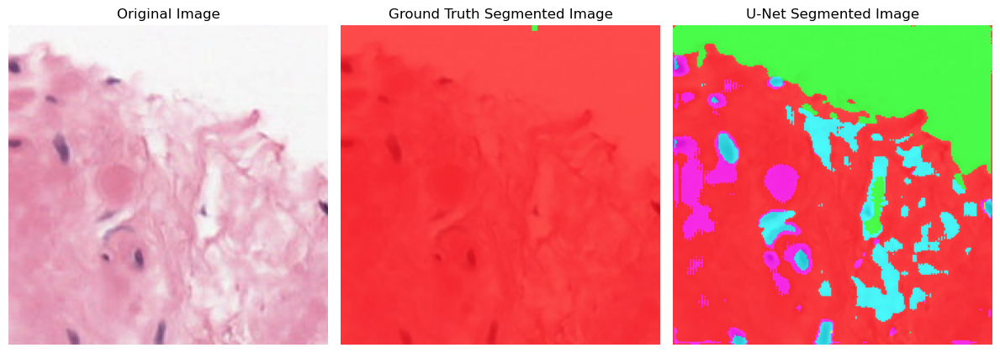

In [395]:
sample_id = 12

plot_gt_pred_image(image = test_images_raw[sample_id].numpy(),
                   gt_mask = test_masks[sample_id].numpy(),
                   pred_mask = test_pred_mask[sample_id].numpy())

Ground truth classes in tile:
  red      : stroma (connective tissue, non-epithelium tissue) (class 1)

Predicted classes in tile:
  green    : background (non tissue) or unknown (class 0)
  red      : stroma (connective tissue, non-epithelium tissue) (class 1)
  blue     : healthy (benign) epithelium (class 2)
  yellow   : cancerous epithelium (Gleason 3) (class 3)
  magenta  : cancerous epithelium (Gleason 4) (class 4)
  cyan     : cancerous epithelium (Gleason 5) (class 5)


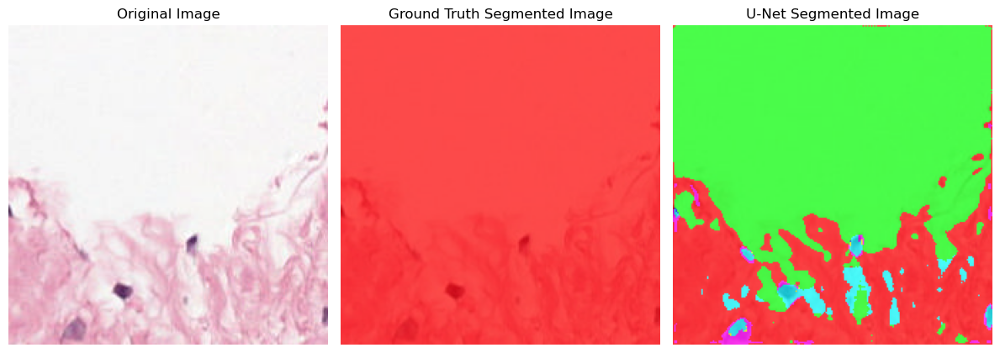

In [396]:
sample_id = 13

plot_gt_pred_image(image = test_images_raw[sample_id].numpy(),
                   gt_mask = test_masks[sample_id].numpy(),
                   pred_mask = test_pred_mask[sample_id].numpy())

Ground truth classes in tile:
  red      : stroma (connective tissue, non-epithelium tissue) (class 1)
  blue     : healthy (benign) epithelium (class 2)

Predicted classes in tile:
  green    : background (non tissue) or unknown (class 0)
  red      : stroma (connective tissue, non-epithelium tissue) (class 1)
  blue     : healthy (benign) epithelium (class 2)
  yellow   : cancerous epithelium (Gleason 3) (class 3)
  magenta  : cancerous epithelium (Gleason 4) (class 4)
  cyan     : cancerous epithelium (Gleason 5) (class 5)


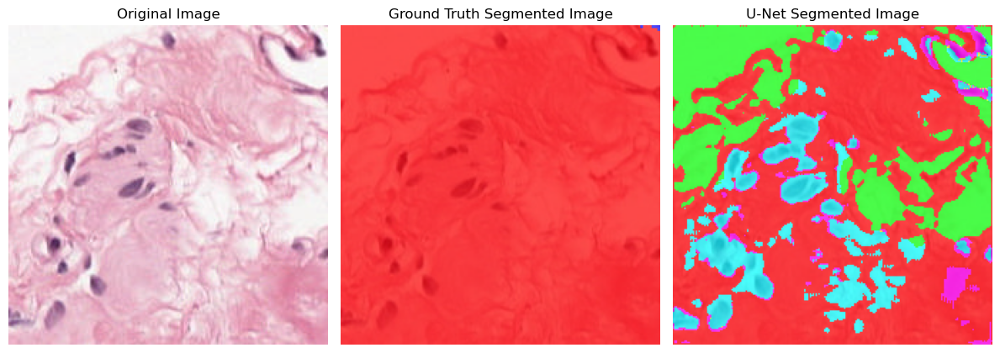

In [397]:
sample_id = 14

plot_gt_pred_image(image = test_images_raw[sample_id].numpy(),
                   gt_mask = test_masks[sample_id].numpy(),
                   pred_mask = test_pred_mask[sample_id].numpy())

Ground truth classes in tile:
  red      : stroma (connective tissue, non-epithelium tissue) (class 1)
  blue     : healthy (benign) epithelium (class 2)

Predicted classes in tile:
  green    : background (non tissue) or unknown (class 0)
  red      : stroma (connective tissue, non-epithelium tissue) (class 1)
  blue     : healthy (benign) epithelium (class 2)
  yellow   : cancerous epithelium (Gleason 3) (class 3)
  magenta  : cancerous epithelium (Gleason 4) (class 4)
  cyan     : cancerous epithelium (Gleason 5) (class 5)


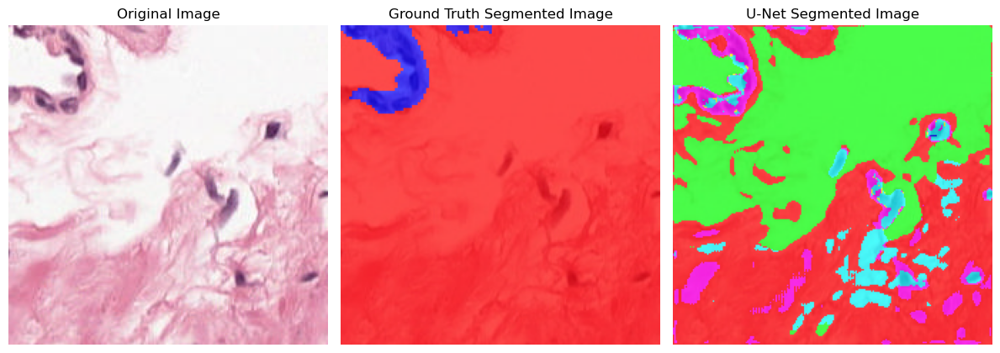

In [398]:
sample_id = 15

plot_gt_pred_image(image = test_images_raw[sample_id].numpy(),
                   gt_mask = test_masks[sample_id].numpy(),
                   pred_mask = test_pred_mask[sample_id].numpy())

Ground truth classes in tile:
  red      : stroma (connective tissue, non-epithelium tissue) (class 1)

Predicted classes in tile:
  green    : background (non tissue) or unknown (class 0)
  red      : stroma (connective tissue, non-epithelium tissue) (class 1)
  yellow   : cancerous epithelium (Gleason 3) (class 3)
  magenta  : cancerous epithelium (Gleason 4) (class 4)
  cyan     : cancerous epithelium (Gleason 5) (class 5)


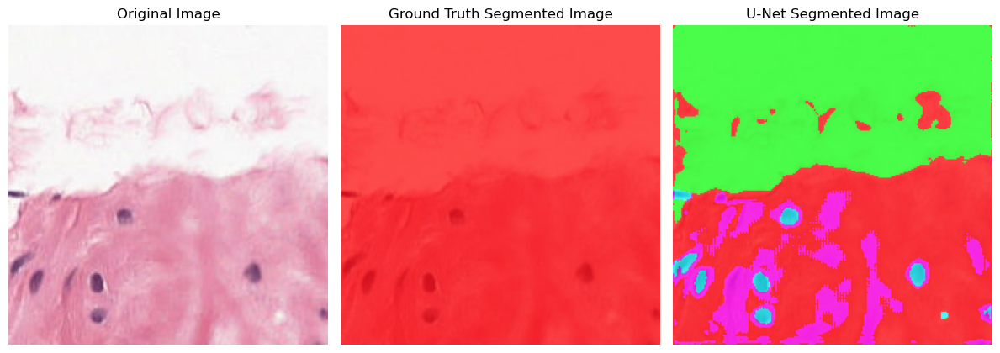

In [399]:
sample_id = 16

plot_gt_pred_image(image = test_images_raw[sample_id].numpy(),
                   gt_mask = test_masks[sample_id].numpy(),
                   pred_mask = test_pred_mask[sample_id].numpy())

Ground truth classes in tile:
  red      : stroma (connective tissue, non-epithelium tissue) (class 1)
  blue     : healthy (benign) epithelium (class 2)

Predicted classes in tile:
  green    : background (non tissue) or unknown (class 0)
  red      : stroma (connective tissue, non-epithelium tissue) (class 1)
  blue     : healthy (benign) epithelium (class 2)
  yellow   : cancerous epithelium (Gleason 3) (class 3)
  magenta  : cancerous epithelium (Gleason 4) (class 4)
  cyan     : cancerous epithelium (Gleason 5) (class 5)


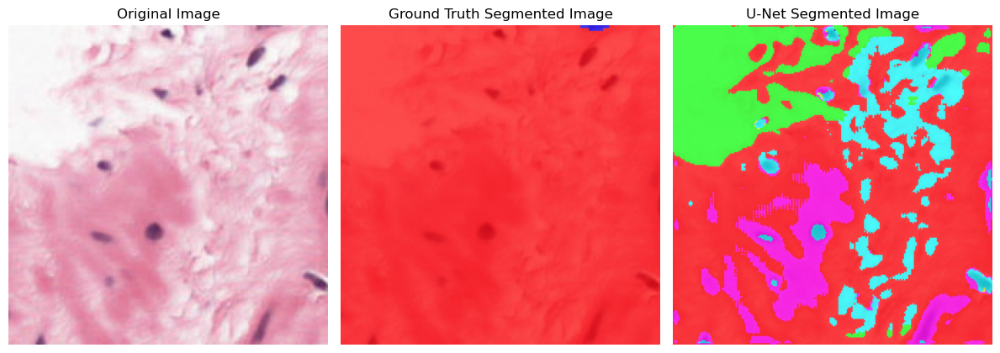

In [400]:
sample_id = 17

plot_gt_pred_image(image = test_images_raw[sample_id].numpy(),
                   gt_mask = test_masks[sample_id].numpy(),
                   pred_mask = test_pred_mask[sample_id].numpy())

Ground truth classes in tile:
  green    : background (non tissue) or unknown (class 0)
  red      : stroma (connective tissue, non-epithelium tissue) (class 1)
  blue     : healthy (benign) epithelium (class 2)
  magenta  : cancerous epithelium (Gleason 4) (class 4)

Predicted classes in tile:
  green    : background (non tissue) or unknown (class 0)
  red      : stroma (connective tissue, non-epithelium tissue) (class 1)
  blue     : healthy (benign) epithelium (class 2)
  yellow   : cancerous epithelium (Gleason 3) (class 3)
  magenta  : cancerous epithelium (Gleason 4) (class 4)
  cyan     : cancerous epithelium (Gleason 5) (class 5)


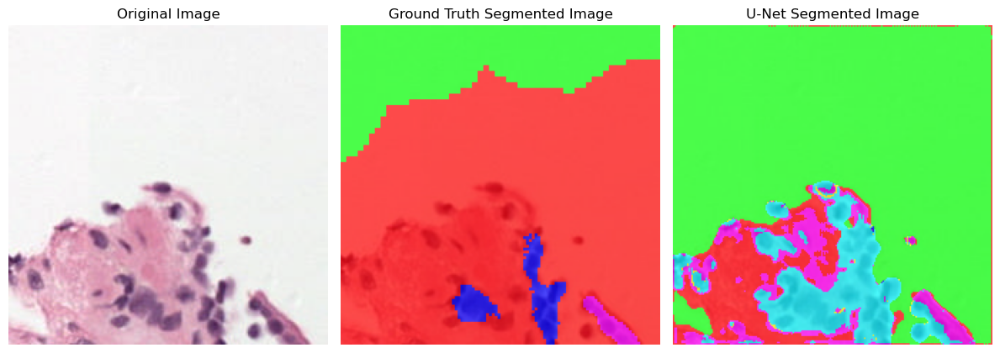

In [401]:
sample_id = 18

plot_gt_pred_image(image = test_images_raw[sample_id].numpy(),
                   gt_mask = test_masks[sample_id].numpy(),
                   pred_mask = test_pred_mask[sample_id].numpy())

Ground truth classes in tile:
  green    : background (non tissue) or unknown (class 0)
  red      : stroma (connective tissue, non-epithelium tissue) (class 1)
  magenta  : cancerous epithelium (Gleason 4) (class 4)

Predicted classes in tile:
  green    : background (non tissue) or unknown (class 0)
  red      : stroma (connective tissue, non-epithelium tissue) (class 1)
  blue     : healthy (benign) epithelium (class 2)
  yellow   : cancerous epithelium (Gleason 3) (class 3)
  magenta  : cancerous epithelium (Gleason 4) (class 4)
  cyan     : cancerous epithelium (Gleason 5) (class 5)


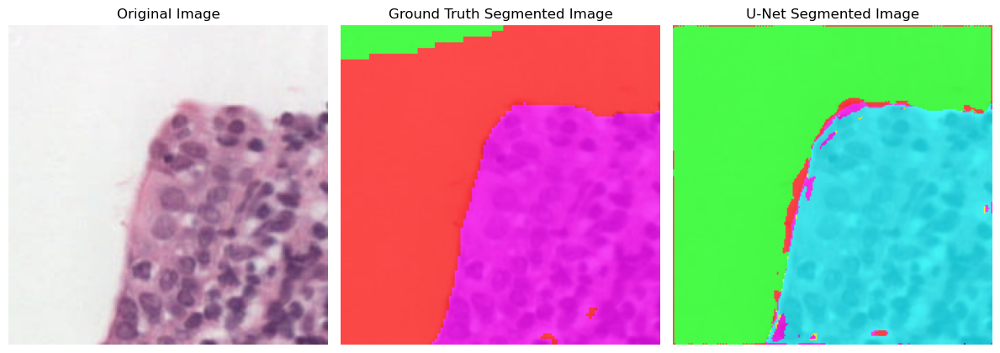

In [402]:
sample_id = 19

plot_gt_pred_image(image = test_images_raw[sample_id].numpy(),
                   gt_mask = test_masks[sample_id].numpy(),
                   pred_mask = test_pred_mask[sample_id].numpy())

Ground truth classes in tile:
  red      : stroma (connective tissue, non-epithelium tissue) (class 1)
  magenta  : cancerous epithelium (Gleason 4) (class 4)

Predicted classes in tile:
  green    : background (non tissue) or unknown (class 0)
  red      : stroma (connective tissue, non-epithelium tissue) (class 1)
  blue     : healthy (benign) epithelium (class 2)
  yellow   : cancerous epithelium (Gleason 3) (class 3)
  magenta  : cancerous epithelium (Gleason 4) (class 4)
  cyan     : cancerous epithelium (Gleason 5) (class 5)


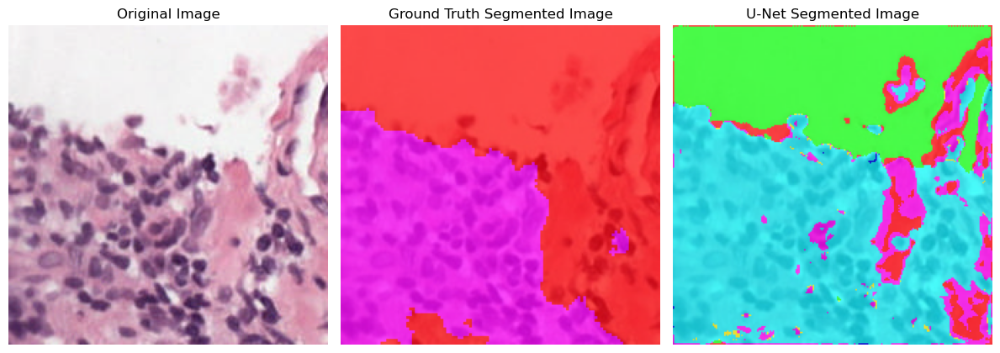

In [403]:
sample_id = 20

plot_gt_pred_image(image = test_images_raw[sample_id].numpy(),
                   gt_mask = test_masks[sample_id].numpy(),
                   pred_mask = test_pred_mask[sample_id].numpy())

Ground truth classes in tile:
  red      : stroma (connective tissue, non-epithelium tissue) (class 1)
  yellow   : cancerous epithelium (Gleason 3) (class 3)
  magenta  : cancerous epithelium (Gleason 4) (class 4)

Predicted classes in tile:
  green    : background (non tissue) or unknown (class 0)
  red      : stroma (connective tissue, non-epithelium tissue) (class 1)
  blue     : healthy (benign) epithelium (class 2)
  yellow   : cancerous epithelium (Gleason 3) (class 3)
  magenta  : cancerous epithelium (Gleason 4) (class 4)
  cyan     : cancerous epithelium (Gleason 5) (class 5)


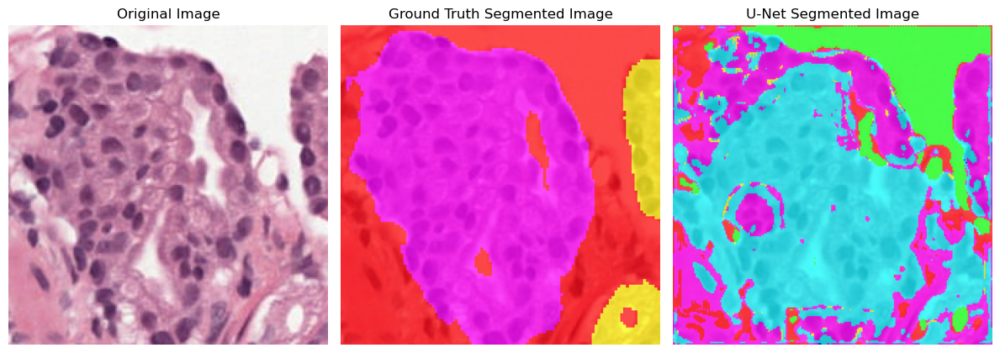

In [404]:
sample_id = 21

plot_gt_pred_image(image = test_images_raw[sample_id].numpy(),
                   gt_mask = test_masks[sample_id].numpy(),
                   pred_mask = test_pred_mask[sample_id].numpy())

Ground truth classes in tile:
  red      : stroma (connective tissue, non-epithelium tissue) (class 1)
  yellow   : cancerous epithelium (Gleason 3) (class 3)

Predicted classes in tile:
  green    : background (non tissue) or unknown (class 0)
  red      : stroma (connective tissue, non-epithelium tissue) (class 1)
  blue     : healthy (benign) epithelium (class 2)
  yellow   : cancerous epithelium (Gleason 3) (class 3)
  magenta  : cancerous epithelium (Gleason 4) (class 4)
  cyan     : cancerous epithelium (Gleason 5) (class 5)


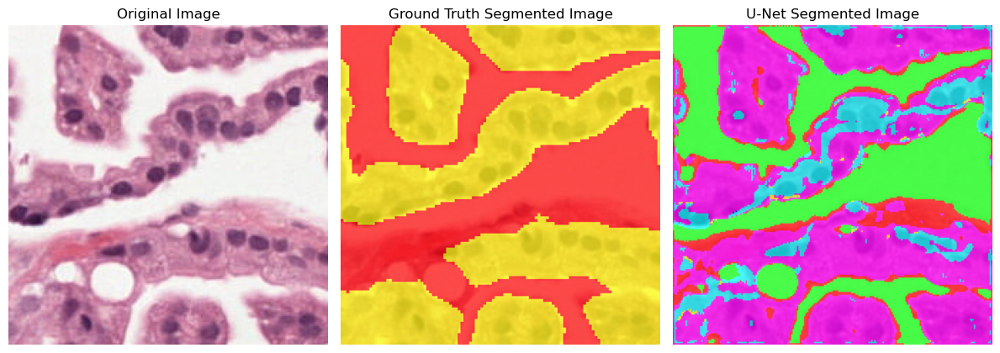

In [405]:
sample_id = 22

plot_gt_pred_image(image = test_images_raw[sample_id].numpy(),
                   gt_mask = test_masks[sample_id].numpy(),
                   pred_mask = test_pred_mask[sample_id].numpy())

Ground truth classes in tile:
  red      : stroma (connective tissue, non-epithelium tissue) (class 1)
  yellow   : cancerous epithelium (Gleason 3) (class 3)

Predicted classes in tile:
  green    : background (non tissue) or unknown (class 0)
  red      : stroma (connective tissue, non-epithelium tissue) (class 1)
  blue     : healthy (benign) epithelium (class 2)
  yellow   : cancerous epithelium (Gleason 3) (class 3)
  magenta  : cancerous epithelium (Gleason 4) (class 4)
  cyan     : cancerous epithelium (Gleason 5) (class 5)


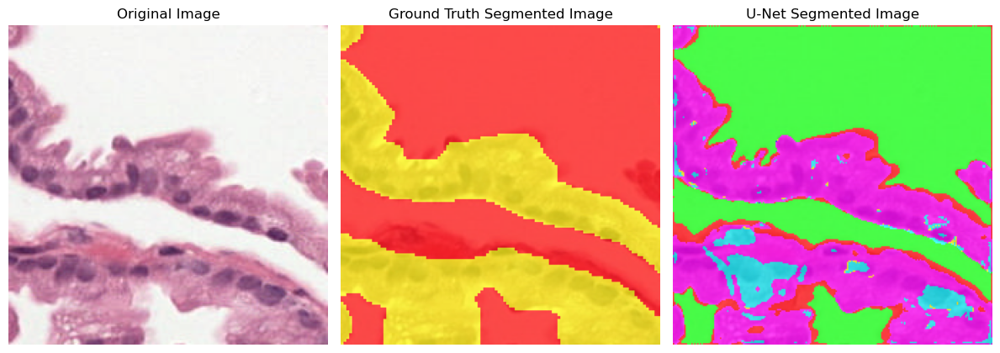

In [406]:
sample_id = 23

plot_gt_pred_image(image = test_images_raw[sample_id].numpy(),
                   gt_mask = test_masks[sample_id].numpy(),
                   pred_mask = test_pred_mask[sample_id].numpy())